# Segmenting and Clustering Neighborhoods in Toronto

**Week 3 Peer-graded Assignment: Applied Data Science Capstone**
<br>
**Coursera IBM Data Science Professional Certificate**

**Created by Sean Kaczanowski**

### Overview:

This notebook was created to satisfy part of the Applied Data Science Capstone course requirements. The **objective** of this notebook was to **segment and cluster neighborhoods in Toronto, Canada.**

This was achieved by:
<ul>
    <li>Scraping postal code data to create a table of neighborhoods in and around Toronto from a Wikipedia page</li>
    <li>Adding latitudinal and longitudinal to the neighborhood data table using API calls to the Python library Geocoder</li>
    <li>Creating a map of of Toronto with neighborhood markers using the Python library Folium</li>
    <li>Clustering and segmenting neighborhoods based upon Foursquare API calls using K-Means Clustering</li>

<a id='Table Of Contents'></a>

### Table of Contents
<ul> 
    <li><a href='#0.0'>0.0 Dependencies</a></li>
    <ul>
        <li>0.1 Download, Install and Import All Dependencies</li>
    </ul>
    <li><a href='#1.0'>1.0 Scrape Postal Code URL, Create Pandas Dataframe and Clean Data</a></li>
    <ul>
        <li>1.1 Scrape Postal Code URL to create Pandas Dataframe</li>
        <li>1.2 Clean the Dataframe Data</li>
    </ul>
    <li><a href='#2.0'>2.0 Get the Latitude and the Longitude Coordinates of each Neighborhood</a></li>
    <ul>
        <li>2.1 Get Latitude and Longitude Coordinates and Append to Dataframe</li>
    </ul>
    <li><a href='#3.0'>3.0 Explore and Cluster Neighborhoods in Toronto</a></li>
    <ul>
        <li><a href='#3.1'>3.1 Create Map of M Postal Codes (Toronto and Surrounding Neighborhoods)</a></li>
        <li><a href='#3.2'>3.2 Test Foursquare Call On A Neighbordhood</a></li>
        <li><a href='#3.3'>3.3 Explore Neighborhoods in Toronto</a></li>
        <li><a href='#3.4'>3.4 Analyze Each Neighborhoods</a></li>
    </ul>
</ul>

<a id='0.0'></a>

### 0.0 Dependencies

<a href='#Table Of Contents'>Table Of Contents</a>

#### 0.1 Download, Install and Import All Dependencies

In [1]:
# Import numpy
import numpy as np

# Import pandas
import pandas as pd

# Import json
import json

# Install and import geocoder
!pip install geocoder
import geocoder

# Install and import geopy
!pip install geopy
import geopy

# Import requests
import requests
from pandas.io.json import json_normalize

# Import matplotlib
import matplotlib.cm as cm
import matplotlib.colors as colors

# Import k-means from sklearn.cluster
from sklearn.cluster import KMeans

# Install and import folium
!pip install folium
import folium

print('Libraries imported.')

     |████████████████████████████████| 98 kB 8.6 MB/s  eta 0:00:01
     |████████████████████████████████| 93 kB 3.0 MB/s  eta 0:00:01
Libraries imported.


<a id='1.0'></a>

### 1.0 Scrape Postal Code URL, Create Pandas Dataframe and Clean Data 

<a href='#Table Of Contents'>Table Of Contents</a>

#### 1.1 Scrape Postal Code URL to create Pandas Dataframe

In [2]:
# Scrape url using pandas to create a data object
data = pd.read_html('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M')
print('Scrape Complete')

Scrape Complete


In [3]:
# Determine how many tables are contained in data
print('Number of tables: ' + str(len(data)))

Number of tables: 3


In [4]:
# Determine which table contains relevent data
print(data[0].shape)
print(data[1].shape)
print(data[2].shape)

(180, 3)
(4, 18)
(2, 18)


In [5]:
# data[0] containes the relevent data with 180 rows and 3 columns
data[0].head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [6]:
# Create pandas dataframe from relevent table
df = data[0]

In [7]:
# Check to see dataframe is what we would like
df.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


#### 1.2 Clean the Dataframe Data

In [8]:
# Check current shape of dataframe
df.shape

(180, 3)

In [9]:
# Rename column names to match assignment instructions
df.columns = ['PostalCode', 'Borough', 'Neighborhood']

In [10]:
# How many rows where Borough is 'Not assigned'?
df[df['Borough'] == 'Not assigned'].count()

PostalCode      77
Borough         77
Neighborhood    77
dtype: int64

In [11]:
# Drop 'Not assigned' Boroughs and reset the dataframe index
df = df[~df.Borough.str.contains("Not assigned")]
df = df.reset_index(drop=True)
df.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


In [12]:
# Check to see if any Neighborhoods are 'Not assigned'
df[df['Borough'] == 'Not assigned'].count()

PostalCode      0
Borough         0
Neighborhood    0
dtype: int64

In [13]:
# Inspect the dataframe
df.head(20)

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
6,M1B,Scarborough,"Malvern, Rouge"
7,M3B,North York,Don Mills
8,M4B,East York,"Parkview Hill, Woodbine Gardens"
9,M5B,Downtown Toronto,"Garden District, Ryerson"


In [14]:
# Inspect the shape
print('Number of rows: ' + str(df.shape[0]))
print('Number of columns: ' + str(df.shape[1]))

Number of rows: 103
Number of columns: 3


<a id='2.0'></a>

### 2.0 Get the Latitude and the Longitude Coordinates of each Neighborhood

<a href='#Table Of Contents'>Table Of Contents</a>

#### 2.1 Get Latitude and Longitude Coordinates and Append to Dataframe

In [15]:
# Create new lists for latitude and longitude to append to dataframe
latitudes = []
longitudes = []

# Get latitude and longitude coordinates for each postal code using geocoder
for i in df['PostalCode']:

    g = geocoder.arcgis('{}, Toronto, Ontario'.format(i))
    lat_lng_coords = g.latlng

    latitudes.append(lat_lng_coords[0])
    longitudes.append(lat_lng_coords[1])

print('Length of latitudes list: ' + str(len(latitudes)))
print('Length of longitudes list: ' + str(len(longitudes)))

Length of latitudes list: 103
Length of longitudes list: 103


In [16]:
# Add latitude and longitude columns to dataframe
df['Latitude'] = latitudes
df['Longitude'] = longitudes
df.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.75245,-79.32991
1,M4A,North York,Victoria Village,43.73057,-79.31306
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.65512,-79.36264
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.72327,-79.45042
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.66253,-79.39188


In [17]:
# Check to see if any latitudes are None
df[df['Latitude'] == None].count()

PostalCode      0
Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64

In [18]:
# Check to see if any longitudes are None
df[df['Longitude'] == None].count()

PostalCode      0
Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64

In [19]:
# Change the name of df to 'tor_data' and check the shape
tor_data = df
print('tor_data')
print('Number of rows: ' + str(tor_data.shape[0]))
print('Number of columns: ' + str(tor_data.shape[1]))

tor_data
Number of rows: 103
Number of columns: 5


<a id='3.0'></a>

### 3.0 Explore and Cluster Neighborhoods in Toronto

<a href='#Table Of Contents'>Table Of Contents</a>

<a id='3.1'></a>

#### 3.1 Create Map of M Postal Codes (Toronto and Surrounding Neighborhoods) 

<a href='#Table Of Contents'>Table Of Contents</a>

In [20]:
# Latitude and longitude of Toronto
tor_latitude = 43.65107
tor_longitude = -79.34702

# create map of M Postal Codes which include neighborhoods in and around Toronto using latitude and longitude values
map_toronto = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=10)

# add markers to map of Toronto and surrounding M postal code neighborhoods
for lat, lng, borough, neighborhood in zip(tor_data['Latitude'], tor_data['Longitude'], tor_data['Borough'], tor_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = label,
        color = 'blue',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(map_toronto)  
    
map_toronto

<a id='3.2'></a>

#### 3.2 Test Foursquare Call On A Neighbordhood

<a href='#Table Of Contents'>Table Of Contents</a>

In [21]:
# Define Foursquare credentials
CLIENT_ID = 'GBZJ3ZTAVYH1RRA2O55FE032ORDCPURMUO3JSR1LFY4MM4TD'
CLIENT_SECRET = 'LNJ3VZH3DGMNXAOALKVARPUEO2WTVDMA5DCRS30IQRKEJXPI'
VERSION = '20180605'
LIMIT = 100

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: GBZJ3ZTAVYH1RRA2O55FE032ORDCPURMUO3JSR1LFY4MM4TD
CLIENT_SECRET:LNJ3VZH3DGMNXAOALKVARPUEO2WTVDMA5DCRS30IQRKEJXPI


In [22]:
# Test call using the first neighborhood
tor_data.loc[5, 'Neighborhood']

'Islington Avenue, Humber Valley Village'

In [23]:
# Get the neighborhood's latitude and longitude values
neighborhood_latitude = tor_data.loc[5, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = tor_data.loc[5, 'Longitude'] # neighborhood longitude value

neighborhood_name = tor_data.loc[5, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Islington Avenue, Humber Valley Village are 43.662630000000036, -79.52830999999998.


In [24]:
# Top 100 venues that are in Parkwoods within a radius of 500 meters
LIMIT = 100 

radius = 500

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=GBZJ3ZTAVYH1RRA2O55FE032ORDCPURMUO3JSR1LFY4MM4TD&client_secret=LNJ3VZH3DGMNXAOALKVARPUEO2WTVDMA5DCRS30IQRKEJXPI&v=20180605&ll=43.662630000000036,-79.52830999999998&radius=500&limit=100'

In [25]:
# Send the GET request
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5fae8904a5421e17cc18b0ad'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Edenbridge - Humber Valley',
  'headerFullLocation': 'Edenbridge - Humber Valley, Toronto',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 8,
  'suggestedBounds': {'ne': {'lat': 43.66713000450004,
    'lng': -79.5221011346927},
   'sw': {'lat': 43.65812999550003, 'lng': -79.53451886530725}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4bfd53764cf820a13849ecf4',
       'name': "Java Joe's Village Cafe",
       'location': {'address': '1500 Islington Ave',
        'crossStreet': 'at Rathburn Rd',
        'lat': 43.662460906352436,
        'lng': -79.5

In [26]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [27]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  app.launch_new_instance()


,name,categories,lat,lng
0,Java Joe's Village Cafe,Café,43.662461,-79.532054
1,TD Canada Trust,Bank,43.662545,-79.531749
2,Shoppers Drug Mart,Pharmacy,43.663067,-79.531753
3,Thorncrest Drug Store,Pharmacy,43.662988,-79.531817
4,Foodland - Toronto,Grocery Store,43.662724,-79.531984


In [28]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

8 venues were returned by Foursquare.


<a id='3.3'></a>

#### 3.3 Explore Neighborhoods in Toronto

<a href='#Table Of Contents'>Table Of Contents</a>

In [80]:
# Define function to GET all nearby venues in Toronto area neighborhoods using only a 750m radius instead of 500m
def getNearbyVenues(names, latitudes, longitudes, radius=750):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [81]:
# Run the above function on each neighborhood and create a new dataframe called tor_venues
tor_venues = getNearbyVenues(names=tor_data['Neighborhood'],
                                   latitudes=tor_data['Latitude'],
                                   longitudes=tor_data['Longitude']
                                  )

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Queen's Park, Ontario Provincial Government
Islington Avenue, Humber Valley Village
Malvern, Rouge
Don Mills
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto, Broadview North (Old East York)
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmo

In [82]:
# Check the size of the resulting dataframe
print(tor_venues.shape)
tor_venues.head()

(3929, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.75245,-79.32991,Brookbanks Park,43.751976,-79.332140,Park
1,Parkwoods,43.75245,-79.32991,PetSmart,43.748639,-79.333488,Pet Store
2,Parkwoods,43.75245,-79.32991,Variety Store,43.751974,-79.333114,Food & Drink Shop
3,Parkwoods,43.75245,-79.32991,Three Valleys Park,43.751195,-79.337356,Park
4,Parkwoods,43.75245,-79.32991,Joey,43.753441,-79.321640,Burger Joint


In [83]:
# How many unique categories can be curated from all the returned venues
print('There are {} uniques categories.'.format(len(tor_venues['Venue Category'].unique())))

There are 312 uniques categories.


<a id='3.4'></a>

#### 3.4 Analyze Each Neighborhoods

<a href='#Table Of Contents'>Table Of Contents</a>

In [84]:
# one hot encoding
tor_onehot = pd.get_dummies(tor_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
tor_onehot['Neighborhood'] = tor_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [tor_onehot.columns[-1]] + list(tor_onehot.columns[:-1])
tor_onehot = tor_onehot[fixed_columns]

tor_onehot.head()

,Zoo Exhibit,Accessories Store,Afghan Restaurant,African Restaurant,Airport,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Argentinian Restaurant,...,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [85]:
# Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
tor_grouped = tor_onehot.groupby('Neighborhood').mean().reset_index()
tor_grouped

,Neighborhood,Zoo Exhibit,Accessories Store,Afghan Restaurant,African Restaurant,Airport,American Restaurant,Animal Shelter,Antique Shop,Aquarium,...,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Agincourt,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.029412,0.0,0.0,0.0,0.0,0.0,0.0
1,"Alderwood, Long Branch",0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,"Bathurst Manor, Wilson Heights, Downsview North",0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,Bayview Village,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,"Bedford Park, Lawrence Manor East",0.0,0.0,0.0,0.0,0.0,0.038462,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,"Willowdale, Willowdale West",0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
94,Woburn,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
95,Woodbine Heights,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
96,York Mills West,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [86]:
# Confirm new shape
tor_grouped.shape

(98, 312)

In [87]:
# Print each neighborhood along with the top 5 most common venues
num_top_venues = 5

for hood in tor_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = tor_grouped[tor_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                 venue  freq
0          Coffee Shop  0.06
1   Chinese Restaurant  0.06
2        Shopping Mall  0.06
3            Pool Hall  0.03
4  Shanghai Restaurant  0.03


----Alderwood, Long Branch----
         venue  freq
0          Pub  0.11
1          Gym  0.11
2  Pizza Place  0.11
3  Coffee Shop  0.11
4     Pharmacy  0.11


----Bathurst Manor, Wilson Heights, Downsview North----
                      venue  freq
0               Coffee Shop  0.12
1         Mobile Phone Shop  0.06
2               Pizza Place  0.06
3  Mediterranean Restaurant  0.06
4                      Park  0.06


----Bayview Village----
                 venue  freq
0          Flower Shop  0.25
1  Japanese Restaurant  0.25
2                Trail  0.25
3                 Café  0.25
4          Zoo Exhibit  0.00


----Bedford Park, Lawrence Manor East----
                venue  freq
0  Italian Restaurant  0.08
1         Coffee Shop  0.08
2      Sandwich Place  0.08
3         Pizza Place  0.08
4  

              venue  freq
0    Clothing Store  0.16
1      Dessert Shop  0.04
2  Greek Restaurant  0.03
3        Restaurant  0.03
4     Women's Store  0.03


----Lawrence Park----
                  venue  freq
0  Gym / Fitness Center  0.11
1                 Trail  0.11
2              Bus Line  0.11
3            Restaurant  0.11
4             Bookstore  0.11


----Leaside----
                    venue  freq
0             Coffee Shop  0.08
1     Sporting Goods Shop  0.06
2  Furniture / Home Store  0.06
3       Electronics Store  0.06
4              Restaurant  0.04


----Little Portugal, Trinity----
                           venue  freq
0                            Bar  0.08
1                           Café  0.05
2                     Restaurant  0.05
3             Italian Restaurant  0.05
4  Vegetarian / Vegan Restaurant  0.04


----Malvern, Rouge----
                  venue  freq
0           Zoo Exhibit   0.6
1  Fast Food Restaurant   0.2
2       Paintball Field   0.2
3       Organic 

                  venue  freq
0           Coffee Shop  0.07
1           Pizza Place  0.07
2   Japanese Restaurant  0.06
3  Fast Food Restaurant  0.06
4                  Café  0.05


----Willowdale, Willowdale West----
               venue  freq
0  Convenience Store  0.09
1        Pizza Place  0.09
2           Bus Line  0.09
3            Butcher  0.09
4      Grocery Store  0.09


----Woburn----
                  venue  freq
0    Chinese Restaurant   0.2
1  Fast Food Restaurant   0.2
2      Department Store   0.2
3           Coffee Shop   0.2
4                  Park   0.2


----Woodbine Heights----
                 venue  freq
0        Grocery Store  0.08
1          Coffee Shop  0.08
2  Arts & Crafts Store  0.05
3       Discount Store  0.03
4                  Bar  0.03


----York Mills West----
                  venue  freq
0           Coffee Shop  0.18
1            Restaurant  0.09
2                  Park  0.09
3  Gym / Fitness Center  0.05
4        Sandwich Place  0.05


----York Mills

In [88]:
# Function to sort the venues in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [89]:
# Create the new dataframe and display the top 10 venues for each neighborhood
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = tor_grouped['Neighborhood']

for ind in np.arange(tor_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tor_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Coffee Shop,Shopping Mall,Chinese Restaurant,Sandwich Place,Clothing Store,Bakery,Bank,Sushi Restaurant,Latin American Restaurant,Supermarket
1,"Alderwood, Long Branch",Coffee Shop,Gym,Convenience Store,Gas Station,Print Shop,Pub,Pizza Place,Sandwich Place,Pharmacy,Dumpling Restaurant
2,"Bathurst Manor, Wilson Heights, Downsview North",Coffee Shop,Mediterranean Restaurant,Fried Chicken Joint,Pizza Place,Pharmacy,Restaurant,Deli / Bodega,Park,Sandwich Place,Mobile Phone Shop
3,Bayview Village,Flower Shop,Café,Trail,Japanese Restaurant,Fish & Chips Shop,Fish Market,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room
4,"Bedford Park, Lawrence Manor East",Pizza Place,Sandwich Place,Coffee Shop,Italian Restaurant,Intersection,Butcher,Café,Sports Club,Locksmith,Liquor Store


#### 3.4 Cluster Neighborhoods

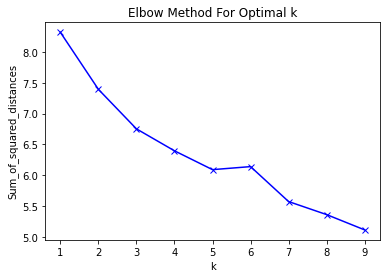

In [90]:
# Determine the optimal number of clusters
import matplotlib.pyplot as plt

tor_grouped_clustering = tor_grouped.drop('Neighborhood', 1)

# Range of clusters from 1 to 10
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(tor_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)
    
# Plot results
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [91]:
# Run k-means to cluster the neighborhood into 5 clusters

# set number of clusters to 5 using the elbow visual inspection method
kclusters = 5

tor_grouped_clustering = tor_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(tor_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([4, 4, 4, 1, 4, 1, 2, 1, 1, 1], dtype=int32)

In [92]:
# Dataframe that includes the cluster as well as the top 10 venues for each neighborhood

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

tor_merged = tor_data

# merge tor_grouped with tor_data to add latitude/longitude for each neighborhood
tor_merged = tor_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

tor_merged.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M3A,North York,Parkwoods,43.75245,-79.32991,2.0,Park,Food & Drink Shop,Burger Joint,Pet Store,Falafel Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space
1,M4A,North York,Victoria Village,43.73057,-79.31306,4.0,Portuguese Restaurant,Intersection,Pizza Place,Coffee Shop,Park,Bus Line,Mediterranean Restaurant,Middle Eastern Restaurant,Hawaiian Restaurant,Health & Beauty Service
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.65512,-79.36264,1.0,Coffee Shop,Park,Pub,Restaurant,Theater,Café,Bakery,Diner,Breakfast Spot,Italian Restaurant
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.72327,-79.45042,4.0,Clothing Store,Dessert Shop,Cosmetics Shop,Women's Store,Men's Store,Fast Food Restaurant,Bookstore,Food Court,Restaurant,Furniture / Home Store
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.66253,-79.39188,1.0,Coffee Shop,Café,Sandwich Place,Park,French Restaurant,Clothing Store,Bubble Tea Shop,Japanese Restaurant,Chinese Restaurant,Boutique


In [93]:
# Check unique values in column 'Cluster Labels'
tor_merged['Cluster Labels'].unique()

array([ 2.,  4.,  1.,  0.,  3., nan])

In [94]:
# Drop rows that contain NaN values
tor_merged = tor_merged.dropna()

In [95]:
# Check unique values in column 'Cluster Labels' again
tor_merged['Cluster Labels'].unique()

array([2., 4., 1., 0., 3.])

In [96]:
# Check shape of dataframe
tor_merged.shape

(102, 16)

In [108]:
# Visualize the resulting clusters

# Create map
map_clusters = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tor_merged['Latitude'], tor_merged['Longitude'], tor_merged['Neighborhood'], tor_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### 3.5 Examine Clusters

In [100]:
# Cluster 1
tor_merged.loc[tor_merged['Cluster Labels'] == 0, tor_merged.columns[[1] + list(range(5, tor_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Scarborough,0.0,Zoo Exhibit,Fast Food Restaurant,Paintball Field,Cosmetics Shop,Creperie,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space


In [101]:
# Cluster 2
tor_merged.loc[tor_merged['Cluster Labels'] == 1, tor_merged.columns[[1] + list(range(5, tor_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Downtown Toronto,1.0,Coffee Shop,Park,Pub,Restaurant,Theater,Café,Bakery,Diner,Breakfast Spot,Italian Restaurant
4,Downtown Toronto,1.0,Coffee Shop,Café,Sandwich Place,Park,French Restaurant,Clothing Store,Bubble Tea Shop,Japanese Restaurant,Chinese Restaurant,Boutique
7,North York,1.0,Coffee Shop,Japanese Restaurant,Park,Intersection,Dim Sum Restaurant,Supermarket,Beer Store,Bank,Restaurant,Electronics Store
9,Downtown Toronto,1.0,Coffee Shop,Japanese Restaurant,Gastropub,Diner,Hotel,Gym,Bookstore,Restaurant,Ramen Restaurant,Plaza
13,North York,1.0,Coffee Shop,Japanese Restaurant,Park,Intersection,Dim Sum Restaurant,Supermarket,Beer Store,Bank,Restaurant,Electronics Store
15,Downtown Toronto,1.0,Coffee Shop,Café,Restaurant,Clothing Store,Seafood Restaurant,American Restaurant,Cosmetics Shop,Italian Restaurant,Bakery,Hotel
20,Downtown Toronto,1.0,Coffee Shop,Hotel,Restaurant,Café,Japanese Restaurant,Beer Bar,Park,Bakery,Seafood Restaurant,Gastropub
22,Scarborough,1.0,Chinese Restaurant,Park,Fast Food Restaurant,Department Store,Coffee Shop,Yoga Studio,Falafel Restaurant,Electronics Store,Elementary School,Escape Room
24,Downtown Toronto,1.0,Coffee Shop,Café,Clothing Store,Ramen Restaurant,Seafood Restaurant,Theater,Japanese Restaurant,Bookstore,Italian Restaurant,Art Gallery
30,Downtown Toronto,1.0,Coffee Shop,Café,Hotel,Theater,Japanese Restaurant,Restaurant,Gastropub,Gym,Bakery,American Restaurant


In [102]:
# Cluster 3
tor_merged.loc[tor_merged['Cluster Labels'] == 2, tor_merged.columns[[1] + list(range(5, tor_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,North York,2.0,Park,Food & Drink Shop,Burger Joint,Pet Store,Falafel Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space
18,Scarborough,2.0,Park,Gym / Fitness Center,Athletics & Sports,Gymnastics Gym,Yoga Studio,Donut Shop,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room
21,York,2.0,Park,Mexican Restaurant,Pizza Place,Gym,Bakery,Women's Store,Fish & Chips Shop,Filipino Restaurant,Dumpling Restaurant,Eastern European Restaurant
27,North York,2.0,Park,Pharmacy,Chinese Restaurant,Residential Building (Apartment / Condo),Bakery,Event Space,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School
45,North York,2.0,Concert Hall,Park,Donut Shop,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant
58,Scarborough,2.0,Park,Convenience Store,General Entertainment,College Stadium,Gym,Skating Rink,Café,Ethiopian Restaurant,Electronics Store,Elementary School
85,Scarborough,2.0,Pharmacy,Sandwich Place,Park,Sushi Restaurant,Falafel Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant
91,Downtown Toronto,2.0,Park,Candy Store,Playground,Grocery Store,Trail,Yoga Studio,Ethiopian Restaurant,Eastern European Restaurant,Electronics Store,Elementary School


In [103]:
# Cluster 4
tor_merged.loc[tor_merged['Cluster Labels'] == 3, tor_merged.columns[[1] + list(range(5, tor_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
16,York,3.0,Convenience Store,Hockey Arena,Grocery Store,Field,Soccer Stadium,Trail,Yoga Studio,Event Space,Eastern European Restaurant,Electronics Store
88,Etobicoke,3.0,Convenience Store,Grocery Store,Park,Skating Rink,Yoga Studio,Event Space,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room


In [104]:
# Cluster 5
tor_merged.loc[tor_merged['Cluster Labels'] == 4, tor_merged.columns[[1] + list(range(5, tor_merged.shape[1]))]]

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,North York,4.0,Portuguese Restaurant,Intersection,Pizza Place,Coffee Shop,Park,Bus Line,Mediterranean Restaurant,Middle Eastern Restaurant,Hawaiian Restaurant,Health & Beauty Service
3,North York,4.0,Clothing Store,Dessert Shop,Cosmetics Shop,Women's Store,Men's Store,Fast Food Restaurant,Bookstore,Food Court,Restaurant,Furniture / Home Store
5,Etobicoke,4.0,Bank,Pharmacy,Bakery,Japanese Restaurant,Convenience Store,Skating Rink,Café,Shopping Mall,Camera Store,Grocery Store
8,East York,4.0,Brewery,Bakery,Construction & Landscaping,Pizza Place,Home Service,Athletics & Sports,Fast Food Restaurant,Breakfast Spot,Gastropub,Soccer Stadium
10,North York,4.0,Grocery Store,Pizza Place,Coffee Shop,Bank,Rental Car Location,Latin American Restaurant,Bakery,Paintball Field,BBQ Joint,Park
...,...,...,...,...,...,...,...,...,...,...,...,...
93,Etobicoke,4.0,Coffee Shop,Gym,Convenience Store,Gas Station,Print Shop,Pub,Pizza Place,Sandwich Place,Pharmacy,Dumpling Restaurant
96,Downtown Toronto,4.0,Coffee Shop,Café,Restaurant,Park,Pizza Place,Diner,Gastropub,Bakery,Thai Restaurant,Chinese Restaurant
98,Etobicoke,4.0,Sushi Restaurant,French Restaurant,Italian Restaurant,Bank,Pub,Dessert Shop,Breakfast Spot,Burger Joint,Liquor Store,Seafood Restaurant
101,Etobicoke,4.0,Coffee Shop,Bank,Park,Fast Food Restaurant,Liquor Store,Sandwich Place,Electronics Store,Chinese Restaurant,Sushi Restaurant,Fried Chicken Joint
